## Preparation

In [ ]:
import csv
import cv2
import itertools
import numpy as np
import pandas as pd
import os
import sys
import tempfile
import tqdm

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

### Code to run pose estimation using MoveNet

In [ ]:
#@title Functions to run pose estimation with MoveNet

!wget -q -O movenet_thunder.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/float16/4?lite-format=tflite
!git clone https://github.com/tensorflow/examples.git
pose_sample_rpi_path = os.path.join(os.getcwd(), 'examples/lite/examples/pose_estimation/raspberry_pi')
sys.path.append(pose_sample_rpi_path)


import utils
from data import BodyPart
from ml import Movenet
movenet = Movenet('movenet_thunder')


def detect(input_tensor, inference_count=3):
  """Runs detection on an input image.

  Args:
    input_tensor: A [height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.
    inference_count: Number of times the model should run repeatly on the
      same input image to improve detection accuracy.

  Returns:
    A Person entity detected by the MoveNet.SinglePose.
  """
  image_height, image_width, channel = input_tensor.shape

  movenet.detect(input_tensor.numpy(), reset_crop_region=True)

  for _ in range(inference_count - 1):
    person = movenet.detect(input_tensor.numpy(),
                            reset_crop_region=False)

  return person

Cloning into 'examples'...
remote: Enumerating objects: 23722, done.
remote: Counting objects: 100% (686/686), done.
remote: Compressing objects: 100% (424/424), done.
remote: Total 23722 (delta 224), reused 614 (delta 174), pack-reused 23036
Receiving objects: 100% (23722/23722), 44.18 MiB | 13.13 MiB/s, done.
Resolving deltas: 100% (12872/12872), done.


In [ ]:
#@title Functions to visualize the pose estimation results.

def draw_prediction_on_image(
    image, person, crop_region=None, close_figure=True,
    keep_input_size=False):
  """Draws the keypoint predictions on image.

  Args:
    image: An numpy array with shape [height, width, channel] representing the
      pixel values of the input image.
    person: A person entity returned from the MoveNet.SinglePose model.
    close_figure: Whether to close the plt figure after the function returns.
    keep_input_size: Whether to keep the size of the input image.

  Returns:
    An numpy array with shape [out_height, out_width, channel] representing the
    image overlaid with keypoint predictions.
  """

  image_np = utils.visualize(image, [person])

  height, width, channel = image.shape
  aspect_ratio = float(width) / height
  fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
  im = ax.imshow(image_np)

  if close_figure:
    plt.close(fig)

  if not keep_input_size:
    image_np = utils.keep_aspect_ratio_resizer(image_np, (512, 512))

  return image_np

In [ ]:
#@title Code to load the images, detect pose landmarks and save them into a CSV file

class MoveNetPreprocessor(object):
  """Helper class to preprocess pose sample images for classification."""

  def __init__(self,
               images_in_folder,
               images_out_folder,
               csvs_out_path):
    """Creates a preprocessor to detection pose from images and save as CSV.

    Args:
      images_in_folder: Path to the folder with the input images. It should
        follow this structure:
        yoga_poses
        |__ downdog
            |______ 00000128.jpg
            |______ 00000181.bmp
            |______ ...
        |__ goddess
            |______ 00000243.jpg
            |______ 00000306.jpg
            |______ ...
        ...
      images_out_folder: Path to write the images overlay with detected
        landmarks. These images are useful when you need to debug accuracy
        issues.
      csvs_out_path: Path to write the CSV containing the detected landmark
        coordinates and label of each image that can be used to train a pose
        classification model.
    """
    self._images_in_folder = images_in_folder
    self._images_out_folder = images_out_folder
    self._csvs_out_path = csvs_out_path
    self._messages = []

    self._csvs_out_folder_per_class = tempfile.mkdtemp()

    self._pose_class_names = sorted(
        [n for n in os.listdir(self._images_in_folder) if not n.startswith('.')]
        )

  def process(self, per_pose_class_limit=None, detection_threshold=0.1):
    """Preprocesses images in the given folder.
    Args:
      per_pose_class_limit: Number of images to load. As preprocessing usually
        takes time, this parameter can be specified to make the reduce of the
        dataset for testing.
      detection_threshold: Only keep images with all landmark confidence score
        above this threshold.
    """

    for pose_class_name in self._pose_class_names:
      print('Preprocessing', pose_class_name, file=sys.stderr)

      images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  pose_class_name + '.csv')
      if not os.path.exists(images_out_folder):
        os.makedirs(images_out_folder)

      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file,
                                    delimiter=',',
                                    quoting=csv.QUOTE_MINIMAL)

        image_names = sorted(
            [n for n in os.listdir(images_in_folder) if not n.startswith('.')])
        if per_pose_class_limit is not None:
          image_names = image_names[:per_pose_class_limit]

        valid_image_count = 0

        for image_name in tqdm.tqdm(image_names):
          image_path = os.path.join(images_in_folder, image_name)

          try:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
          except:
            self._messages.append('Skipped ' + image_path + '. Invalid image.')
            continue
          else:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
            image_height, image_width, channel = image.shape

          if channel != 3:
            self._messages.append('Skipped ' + image_path +
                                  '. Image isn\'t in RGB format.')
            continue
          person = detect(image)

          min_landmark_score = min(
              [keypoint.score for keypoint in person.keypoints])
          should_keep_image = min_landmark_score >= detection_threshold
          if not should_keep_image:
            self._messages.append('Skipped ' + image_path +
                                  '. No pose was confidentlly detected.')
            continue

          valid_image_count += 1

          output_overlay = draw_prediction_on_image(
              image.numpy().astype(np.uint8), person,
              close_figure=True, keep_input_size=True)

          output_frame = cv2.cvtColor(output_overlay, cv2.COLOR_RGB2BGR)
          cv2.imwrite(os.path.join(images_out_folder, image_name), output_frame)

          pose_landmarks = np.array(
              [[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score]
                for keypoint in person.keypoints],
              dtype=np.float32)

          coordinates = pose_landmarks.flatten().astype(np.str).tolist()
          csv_out_writer.writerow([image_name] + coordinates)

        if not valid_image_count:
          raise RuntimeError(
              'No valid images found for the "{}" class.'
              .format(pose_class_name))

    print('\n'.join(self._messages))

    all_landmarks_df = self._all_landmarks_as_dataframe()
    all_landmarks_df.to_csv(self._csvs_out_path, index=False)

  def class_names(self):
    """List of classes found in the training dataset."""
    return self._pose_class_names

  def _all_landmarks_as_dataframe(self):
    """Merge all per-class CSVs into a single dataframe."""
    total_df = None
    for class_index, class_name in enumerate(self._pose_class_names):
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  class_name + '.csv')
      per_class_df = pd.read_csv(csv_out_path, header=None)

      per_class_df['class_no'] = [class_index]*len(per_class_df)
      per_class_df['class_name'] = [class_name]*len(per_class_df)

      per_class_df[per_class_df.columns[0]] = (os.path.join(class_name, '')
        + per_class_df[per_class_df.columns[0]].astype(str))

      if total_df is None:
        total_df = per_class_df
      else:
        total_df = pd.concat([total_df, per_class_df], axis=0)

    list_name = [[bodypart.name + '_x', bodypart.name + '_y',
                  bodypart.name + '_score'] for bodypart in BodyPart]
    header_name = []
    for columns_name in list_name:
      header_name += columns_name
    header_name = ['file_name'] + header_name
    header_map = {total_df.columns[i]: header_name[i]
                  for i in range(len(header_name))}

    total_df.rename(header_map, axis=1, inplace=True)

    return total_df

## Preprocess the input images



In [ ]:
import os
import random
import shutil

def split_into_train_test(images_origin, images_dest, test_split):
  """Splits a directory of sorted images into training and test sets.

  Args:
    images_origin: Path to the directory with your images. This directory
      must include subdirectories for each of your labeled classes. For example:
      yoga_poses/
      |__ downdog/
          |______ 00000128.jpg
          |______ 00000181.jpg
          |______ ...
      |__ goddess/
          |______ 00000243.jpg
          |______ 00000306.jpg
          |______ ...
      ...
    images_dest: Path to a directory where you want the split dataset to be
      saved. The results looks like this:
      split_yoga_poses/
      |__ train/
          |__ downdog/
              |______ 00000128.jpg
              |______ ...
      |__ test/
          |__ downdog/
              |______ 00000181.jpg
              |______ ...
    test_split: Fraction of data to reserve for test (float between 0 and 1).
  """
  _, dirs, _ = next(os.walk(images_origin))

  TRAIN_DIR = os.path.join(images_dest, 'train')
  TEST_DIR = os.path.join(images_dest, 'test')
  os.makedirs(TRAIN_DIR, exist_ok=True)
  os.makedirs(TEST_DIR, exist_ok=True)

  for dir in dirs:
    filenames = os.listdir(os.path.join(images_origin, dir))
    filenames = [os.path.join(images_origin, dir, f) for f in filenames if (
        f.endswith('.png') or f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.bmp'))]
    filenames.sort()
    random.seed(42)
    random.shuffle(filenames)
    os.makedirs(os.path.join(TEST_DIR, dir), exist_ok=True)
    os.makedirs(os.path.join(TRAIN_DIR, dir), exist_ok=True)
    test_count = int(len(filenames) * test_split)
    for i, file in enumerate(filenames):
      if i < test_count:
        destination = os.path.join(TEST_DIR, dir, os.path.split(file)[1])
      else:
        destination = os.path.join(TRAIN_DIR, dir, os.path.split(file)[1])
      shutil.copyfile(file, destination)
    print(f'Moved {test_count} of {len(filenames)} from class "{dir}" into test.')
  print(f'Your split dataset is in "{images_dest}"')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q '/content/drive/MyDrive/PregAI/Dataset/yoga-9.zip' -d '/content/drive/MyDrive/PregAI/Dataset/'
dataset_in = '/content/drive/MyDrive/PregAI/Dataset/yoga-9'

if not os.path.isdir(dataset_in):
    raise Exception("dataset_in is not a valid directory")

else:
    dataset_out =  dataset_in + '_split'
    split_into_train_test(dataset_in, dataset_out, test_split=0.2)
    IMAGES_ROOT = dataset_out

Moved 160 of 800 from class "Cat Cow Pose" into test.
Moved 160 of 800 from class "Chair Pose" into test.
Moved 159 of 797 from class "Downward Dog Pose" into test.
Moved 160 of 800 from class "Extended Revolved Triangle Pose" into test.
Moved 157 of 788 from class "Plank Pose" into test.
Moved 160 of 800 from class "Standing Forward Bend Pose" into test.
Moved 159 of 798 from class "Tree Pose" into test.
Moved 159 of 798 from class "Warrior 2 Pose" into test.
Moved 159 of 799 from class "Warrior Pose" into test.
Your split dataset is in "/content/drive/MyDrive/PregAI/Dataset/yoga-9_split"


### Preprocess the `TRAIN` dataset

In [ ]:
images_in_train_folder = os.path.join(IMAGES_ROOT, 'train')
images_out_train_folder = '/content/drive/MyDrive/PregAI/ML Model/poses_images_out_train'
csvs_out_train_path = '/content/drive/MyDrive/PregAI/ML Model/train_data.csv'

preprocessor = MoveNetPreprocessor(
    images_in_folder=images_in_train_folder,
    images_out_folder=images_out_train_folder,
    csvs_out_path=csvs_out_train_path,
)

preprocessor.process(per_pose_class_limit=None)

### Preprocess the `TEST` dataset

In [ ]:
images_in_test_folder = os.path.join(IMAGES_ROOT, 'test')
images_out_test_folder = '/content/drive/MyDrive/PregAI/ML Model/poses_images_out_test'
csvs_out_test_path = '/content/drive/MyDrive/PregAI/ML Model/test_data.csv'

preprocessor = MoveNetPreprocessor(
    images_in_folder=images_in_test_folder,
    images_out_folder=images_out_test_folder,
    csvs_out_path=csvs_out_test_path,
)

preprocessor.process(per_pose_class_limit=None)

## Train a pose classification model that takes the landmark coordinates as input, and output the predicted labels.



### Load the preprocessed CSVs into `TRAIN` and `TEST` datasets.

In [77]:
dataset_in = '/content/drive/MyDrive/PregAI/Dataset/yoga-9'

IMAGES_ROOT = '/content/drive/MyDrive/PregAI/Dataset/yoga-9_split'

images_out_train_folder = '/content/drive/MyDrive/PregAI/ML Model/poses_images_out_train'
images_out_test_folder = '/content/drive/MyDrive/PregAI/ML Model/poses_images_out_test'

csv1_train_path = '/content/drive/MyDrive/PregAI/ML Model/Model 1/train_data_1.csv'
csv1_test_path = '/content/drive/MyDrive/PregAI/ML Model/Model 1/test_data_1.csv'

csv2_train_path =  '/content/drive/MyDrive/PregAI/ML Model/Model 2/train_data_2.csv'
csv2_test_path = '/content/drive/MyDrive/PregAI/ML Model/Model 2/test_data_2.csv'

In [ ]:
csv1_train = pd.read_csv(csv1_train_path)
csv1_test = pd.read_csv(csv1_test_path)

csv2_train = pd.read_csv(csv2_train_path)
csv2_test = pd.read_csv(csv2_test_path)

combined_csv_train = pd.concat([csv1_train, csv2_train], ignore_index=True)
combined_csv_test = pd.concat([csv1_test, csv2_test], ignore_index=True)

combined_csv_train.to_csv('/content/drive/MyDrive/PregAI/ML Model/train_data_combine.csv', index=False)
combined_csv_test.to_csv('/content/drive/MyDrive/PregAI/ML Model/test_data_combine.csv', index=False)

In [86]:
def load_pose_landmarks(csv_path):
  """Loads a CSV created by MoveNetPreprocessor.

  Returns:
    X: Detected landmark coordinates and scores of shape (N, 17 * 3)
    y: Ground truth labels of shape (N, label_count)
    classes: The list of all class names found in the dataset
    dataframe: The CSV loaded as a Pandas dataframe features (X) and ground
      truth labels (y) to use later to train a pose classification model.
  """

  dataframe = pd.read_csv(csv_path)
  df_to_process = dataframe.copy()

  df_to_process.drop(columns=['file_name'], inplace=True)

  classes = df_to_process.pop('class_name').unique()

  y = df_to_process.pop('class_no')

  X = df_to_process.astype('float64')
  y = keras.utils.to_categorical(y)

  return X, y, classes, dataframe

Load and split the original `TRAIN` dataset into `TRAIN` (85% of the data) and `VALIDATE` (the remaining 15%).

In [87]:
csvs_combine_train_path = '/content/drive/MyDrive/PregAI/ML Model/train_data_combine.csv'
csvs_combine_test_path = '/content/drive/MyDrive/PregAI/ML Model/test_data_combine.csv'

X, y, class_names, _ = load_pose_landmarks(csvs_combine_train_path)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.15)

In [80]:
X_test, y_test, _, df_test = load_pose_landmarks(csvs_combine_test_path)

### Define functions to convert the pose landmarks to a pose embedding (a.k.a. feature vector) for pose classification



In [88]:
def get_center_point(landmarks, left_bodypart, right_bodypart):
  """Calculates the center point of the two given landmarks."""

  left = tf.gather(landmarks, left_bodypart.value, axis=1)
  right = tf.gather(landmarks, right_bodypart.value, axis=1)
  center = left * 0.5 + right * 0.5
  return center


def get_pose_size(landmarks, torso_size_multiplier=2.5):
  """Calculates pose size.

  It is the maximum of two values:
    * Torso size multiplied by `torso_size_multiplier`
    * Maximum distance from pose center to any pose landmark
  """

  hips_center = get_center_point(landmarks, BodyPart.LEFT_HIP,
                                 BodyPart.RIGHT_HIP)

  shoulders_center = get_center_point(landmarks, BodyPart.LEFT_SHOULDER,
                                      BodyPart.RIGHT_SHOULDER)

  torso_size = tf.linalg.norm(shoulders_center - hips_center)

  pose_center_new = get_center_point(landmarks, BodyPart.LEFT_HIP,
                                     BodyPart.RIGHT_HIP)
  pose_center_new = tf.expand_dims(pose_center_new, axis=1)

  pose_center_new = tf.broadcast_to(pose_center_new,
                                    [tf.size(landmarks) // (17*2), 17, 2])

  d = tf.gather(landmarks - pose_center_new, 0, axis=0,
                name="dist_to_pose_center")

  max_dist = tf.reduce_max(tf.linalg.norm(d, axis=0))

  pose_size = tf.maximum(torso_size * torso_size_multiplier, max_dist)

  return pose_size


def normalize_pose_landmarks(landmarks):
  """Normalizes the landmarks translation by moving the pose center to (0,0) and
  scaling it to a constant pose size.
  """

  pose_center = get_center_point(landmarks, BodyPart.LEFT_HIP,
                                 BodyPart.RIGHT_HIP)
  pose_center = tf.expand_dims(pose_center, axis=1)

  pose_center = tf.broadcast_to(pose_center,
                                [tf.size(landmarks) // (17*2), 17, 2])
  landmarks = landmarks - pose_center

  pose_size = get_pose_size(landmarks)
  landmarks /= pose_size

  return landmarks


def landmarks_to_embedding(landmarks_and_scores):
  """Converts the input landmarks into a pose embedding."""

  reshaped_inputs = keras.layers.Reshape((17, 3))(landmarks_and_scores)

  landmarks = normalize_pose_landmarks(reshaped_inputs[:, :, :2])

  embedding = keras.layers.Flatten()(landmarks)

  return embedding

### Define a Keras model for pose classification

Keras model takes the detected pose landmarks, then calculates the pose embedding and predicts the pose class.

In [89]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

inputs = tf.keras.Input(shape=(51))
embedding = landmarks_to_embedding(inputs)

layer = layers.Dense(256, activation=tf.nn.relu)(embedding)
layer = layers.BatchNormalization()(layer)
layer = layers.Dropout(0.5)(layer)

layer = layers.Dense(128, activation=tf.nn.relu)(layer)
layer = layers.BatchNormalization()(layer)
layer = layers.Dropout(0.5)(layer)

layer = layers.Dense(64, activation=tf.nn.leaky_relu)(layer)
layer = layers.BatchNormalization()(layer)
layer = layers.Dropout(0.5)(layer)

outputs = layers.Dense(len(class_names), activation="softmax")(layer)

model = keras.Model(inputs, outputs)
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 51)]                 0         []                            
                                                                                                  
 reshape_4 (Reshape)         (None, 17, 3)                0         ['input_5[0][0]']             
                                                                                                  
 tf.__operators__.getitem_4  (None, 17, 2)                0         ['reshape_4[0][0]']           
  (SlicingOpLambda)                                                                               
                                                                                                  
 tf.compat.v1.gather_36 (TF  (None, 2)                    0         ['tf.__operators__.getit

In [90]:
from sklearn.utils import class_weight

class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(np.argmax(y_train, axis=1)), y=np.argmax(y_train, axis=1))
class_weight_dict = dict(enumerate(class_weights))

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

checkpoint_path = "weights.best.hdf5"
checkpoint = keras.callbacks.ModelCheckpoint(checkpoint_path,
                             monitor='val_accuracy',
                             verbose=1,
                             save_best_only=True,
                             mode='max')

earlystopping = keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                              patience=20)

history = model.fit(X_train, y_train,
                    epochs=500,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    class_weight=class_weight_dict,
                    callbacks=[checkpoint, earlystopping])

# model.save("final_model.h5")


Epoch 1/500
127/133 [===========================>..] - ETA: 0s - loss: 2.0084 - accuracy: 0.3435
Epoch 1: val_accuracy improved from -inf to 0.25733, saving model to weights.best.hdf5
133/133 [==============================] - 6s 12ms/step - loss: 1.9802 - accuracy: 0.3504 - val_loss: 2.0465 - val_accuracy: 0.2573
Epoch 2/500
 18/133 [===>..........................] - ETA: 0s - loss: 1.3528 - accuracy: 0.5208

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


126/133 [===========================>..] - ETA: 0s - loss: 1.1856 - accuracy: 0.5806
Epoch 2: val_accuracy improved from 0.25733 to 0.28400, saving model to weights.best.hdf5
133/133 [==============================] - 1s 8ms/step - loss: 1.1729 - accuracy: 0.5835 - val_loss: 1.8066 - val_accuracy: 0.2840
Epoch 3/500
122/133 [==========================>...] - ETA: 0s - loss: 0.8876 - accuracy: 0.6883
Epoch 3: val_accuracy improved from 0.28400 to 0.67600, saving model to weights.best.hdf5
133/133 [==============================] - 1s 6ms/step - loss: 0.8841 - accuracy: 0.6915 - val_loss: 1.2604 - val_accuracy: 0.6760
Epoch 4/500
132/133 [============================>.] - ETA: 0s - loss: 0.6873 - accuracy: 0.7652
Epoch 4: val_accuracy improved from 0.67600 to 0.91467, saving model to weights.best.hdf5
133/133 [==============================] - 1s 5ms/step - loss: 0.6882 - accuracy: 0.7648 - val_loss: 0.6782 - val_accuracy: 0.9147
Epoch 5/500
124/133 [==========================>...] - ETA

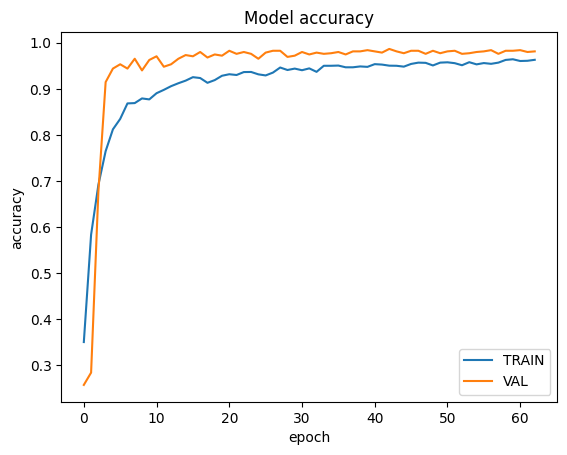

In [91]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'VAL'], loc='lower right')
plt.show()

In [92]:
# Evaluate the model using the TEST dataset
loss, accuracy = model.evaluate(X_test, y_test)

39/39 [==============================] - 0s 2ms/step - loss: 0.0748 - accuracy: 0.9821


### Draw the confusion matrix to better understand the model performance

39/39 [==============================] - 3s 7ms/step
Confusion matrix, without normalization

Classification Report:
                                  precision    recall  f1-score   support

                   Cat Cow Pose       1.00      1.00      1.00       143
                     Chair Pose       0.95      1.00      0.98       139
              Downward Dog Pose       0.98      0.98      0.98       130
Extended Revolved Triangle Pose       1.00      1.00      1.00       142
                     Plank Pose       0.99      0.99      0.99       154
     Standing Forward Bend Pose       0.96      1.00      0.98       128
                      Tree Pose       0.99      0.98      0.99       149
                 Warrior 2 Pose       0.99      0.96      0.98       150
                   Warrior Pose       0.95      0.91      0.93        91

                       accuracy                           0.98      1226
                      macro avg       0.98      0.98      0.98      1226
    

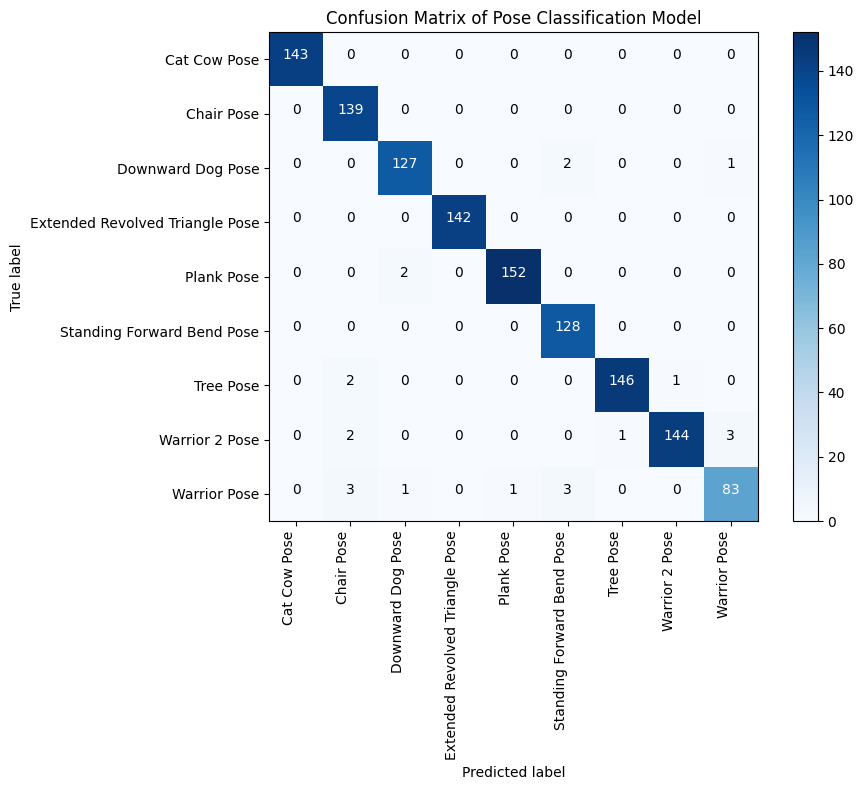

In [93]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """Plots the confusion matrix."""
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90, ha="right")
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

y_pred = model.predict(X_test)

y_pred_label = [class_names[i] for i in np.argmax(y_pred, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_test, axis=1)]

cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm,
                      class_names,
                      title ='Confusion Matrix of Pose Classification Model')

print('\nClassification Report:\n', classification_report(y_true_label,
                                                          y_pred_label))

### Visualize a random of predictions


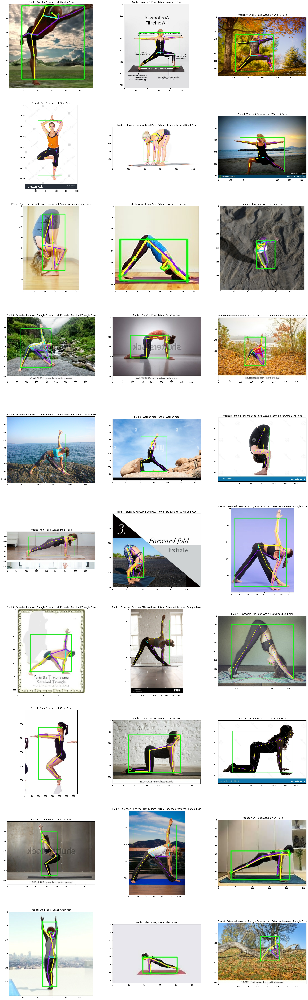


Total Tests: 30
Correct Predictions: 30
Incorrect Predictions: 0


In [94]:
import random

IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 30

# Randomly select images from the test set
random_selection = random.sample(range(len(y_test)), min(MAX_NO_OF_IMAGE_TO_PLOT, len(y_test)))

# Plot the randomly selected images
row_count = len(random_selection) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))

# Count correct and incorrect predictions
correct_count = 0
incorrect_count = 0

for i, id_in_df in enumerate(random_selection):
    ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
    image_path = os.path.join(images_out_test_folder, df_test.iloc[id_in_df]['file_name'])

    image = cv2.imread(image_path)
    prediction = y_pred_label[id_in_df]
    actual = y_true_label[id_in_df]

    plt.title("Predict: %s; Actual: %s" % (prediction, actual))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Check if the prediction is correct
    if prediction == actual:
        correct_count += 1
    else:
        incorrect_count += 1

plt.show()

# Print the counts
print("\nTotal Tests:", MAX_NO_OF_IMAGE_TO_PLOT)
print("Correct Predictions:", correct_count)
print("Incorrect Predictions:", incorrect_count)

## Convert the pose classification model to TensorFlow Lite and apply dynamic range quantization


In [100]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

print('Model size: %dKB' % (len(tflite_model) / 1024))

with open('yoga_pose_classifier.tflite', 'wb') as f:
  f.write(tflite_model)

Model size: 66KB


In [101]:
with open('yoga_pose_labels.txt', 'w') as f:
  f.write('\n'.join(class_names))

### Evaluate the quantized TFLite model

In [102]:
def evaluate_model(interpreter, X, y_true):
  """Evaluates the given TFLite model and return its accuracy."""
  input_index = interpreter.get_input_details()[0]["index"]
  output_index = interpreter.get_output_details()[0]["index"]

  y_pred = []
  for i in range(len(y_true)):
    test_image = X[i: i + 1].astype('float32')
    interpreter.set_tensor(input_index, test_image)

    interpreter.invoke()

    output = interpreter.tensor(output_index)
    predicted_label = np.argmax(output()[0])
    y_pred.append(predicted_label)

  y_pred = keras.utils.to_categorical(y_pred)
  return accuracy_score(y_true, y_pred)

classifier_interpreter = tf.lite.Interpreter(model_content=tflite_model)
classifier_interpreter.allocate_tensors()
print('Accuracy of TFLite model: %s' %
      evaluate_model(classifier_interpreter, X_test, y_test))

Accuracy of TFLite model: 0.9828711256117455


In [103]:
!zip yoga_pose_classifier.zip yoga_pose_labels.txt yoga_pose_classifier.tflite

  adding: yoga_pose_labels.txt (deflated 34%)
  adding: yoga_pose_classifier.tflite (deflated 29%)


In [104]:
# Download the zip archive if running on Colab.
try:
  from google.colab import files
  files.download('yoga_pose_classifier.zip')
except:
  pass

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>